# Question 3

## Unsupervised Learning

How can we use unsupervised learning techniques to better understand scripts - and better understand the difference between scenes that might pass the Bechdel test, and those that do not seem to pass it.

In [1]:
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.decomposition import NMF, LatentDirichletAllocation, MiniBatchNMF
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.datasets import make_blobs
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.express as px
import pandas as pd
import numpy as np
import os
import ast

from nltk.tokenize import RegexpTokenizer
import re
import nltk

In [2]:
# This code is lifted from sci-kit-learn: https://scikit-learn.org/stable/auto_examples/applications/plot_topics_extraction_with_nmf_lda.html#sphx-glr-auto-examples-applications-plot-topics-extraction-with-nmf-lda-py
def plot_top_words(model, feature_names, n_top_words, title, numTopics = 3):
    fig, axes = plt.subplots(numTopics, 5, figsize=(60, 20), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        try:
            top_features_ind = topic.argsort()[-n_top_words:]
            top_features = feature_names[top_features_ind]
            weights = topic[top_features_ind]
    
            ax = axes[topic_idx]
            ax.barh(top_features, weights, height=0.7)
            ax.set_title(f"Topic {topic_idx +1}", fontdict={"fontsize": 30})
            ax.tick_params(axis="both", which="major", labelsize=20)
            for i in "top right left".split():
                ax.spines[i].set_visible(False)
            fig.suptitle(title, fontsize=40)
        except:
            pass
    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()


In [3]:
# Loading cleaned data that contains Bechdel and Media Diversity scores alongwith other movie features
bechdel = pd.read_csv('Dataset/allBechdelMovies.csv', index_col=False).drop(columns=['imdb_id', 'rating', 'passesBechdel'])
media = pd.read_csv('Dataset/allMediaDiversityMovies.csv', index_col=False).drop(columns=['score'])
# Combining the two datasets
movies = pd.concat([bechdel, media])
movies.sample(5)

,known_chars,known_females,known_males,known_nbs,scenes_two_non_males,scenes_no_males,scenes_bechdel,file_name,tmdb_id
287,21,3,9,0,0,0,0,Mud,103731
198,12,2,10,0,0,0,0,Hot-Tub-Time-Machine,23048
536,13,3,10,0,15,5,3,Return-to-Me,2621
340,24,10,13,0,19,6,1,Runaway-Bride,4806
573,14,10,2,0,8,6,1,What-Women-Wan,3981


## QUESTION 3.1

**Can we cluster based on scene importance and number of characters? What does it show us?** 

In [4]:
# Empty list to store the scene data
scenes = []
for f in os.listdir('Dataset/allScenes'):
    if not f.endswith('.csv'):
        continue
    scenes.append(pd.read_csv('Dataset/allScenes/' + f, index_col=False))

# Combining all the scene data
scenes = pd.concat(scenes)

In [5]:
scenes.sample(5)

,chars,females,males,nbs,unknowns,total_tokens,total_others,talking_about_men,importance,movie_filename
10,1,0,1,0,0,"['told', 'take']",['him'],True,0.111873,Speed-Racer
95,2,0,2,0,0,"['work', 'know', 'friend', 'job', 'van', 'exce...","['george', 'gregoire']",True,0.395403,Hotel-Rwanda
90,3,2,1,0,0,"['met', 'know', 'scored', 'including', 'audien...","['she', 'his', 'shari', 'he', 'jill']",True,0.385580,Ed-TV
41,2,0,2,0,0,"['amused', 'throw', 'well', 'find', 'know', 's...","['jack', 'she', 'his', 'her', 'eliot', 'he']",True,0.421089,AfterLife
33,2,0,2,0,0,"['kid', 'bring', 'might', 'would', 'bastard', ...","['his', 'welsh', 'fife', 'him', 'he']",True,0.470174,The-Thin-Red-Line


In [6]:
# Getting the target and feature columns
X = scenes[['females', 'males', 'importance']]

# Scaling the data
scaler = StandardScaler().fit(X)
X = pd.DataFrame(scaler.transform(X), columns=X.columns)
X.head(5)

,females,males,importance
0,0.432522,-1.154786,1.093617
1,1.673610,-1.154786,0.167640
2,0.432522,-1.154786,-0.598395
3,0.432522,-1.154786,-0.899822
4,0.432522,-1.154786,-1.343475


KElbowVisualizer(ax=<AxesSubplot:title={'center':'Elbow Plot using Calinski Harabasz'}>,
                 estimator=KMeans(n_clusters=15, random_state=17), k=(2, 16),
                 metric='calinski_harabasz', timings=False)

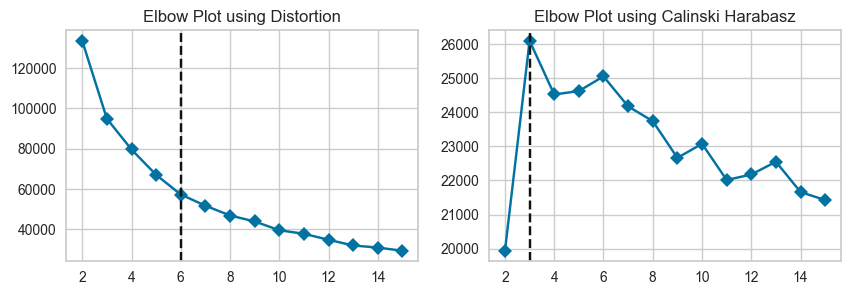

In [7]:
# Finding the optimal number of clusters
model = KMeans(random_state=17)
figs, axes = plt.subplots(1, 2, figsize = (10,3))

visualizer = KElbowVisualizer(model, k=(2, 16), metric = 'distortion', timings = False, ax = axes[0])
axes[0].set_title('Elbow Plot using Distortion')
visualizer.fit(X)

visualizer1 = KElbowVisualizer(model, k=(2, 16), metric = 'calinski_harabasz', timings = False, ax = axes[1])
axes[1].set_title('Elbow Plot using Calinski Harabasz')
visualizer1.fit(X)

The elbow plot with the distortion score gives 6 clusters. 

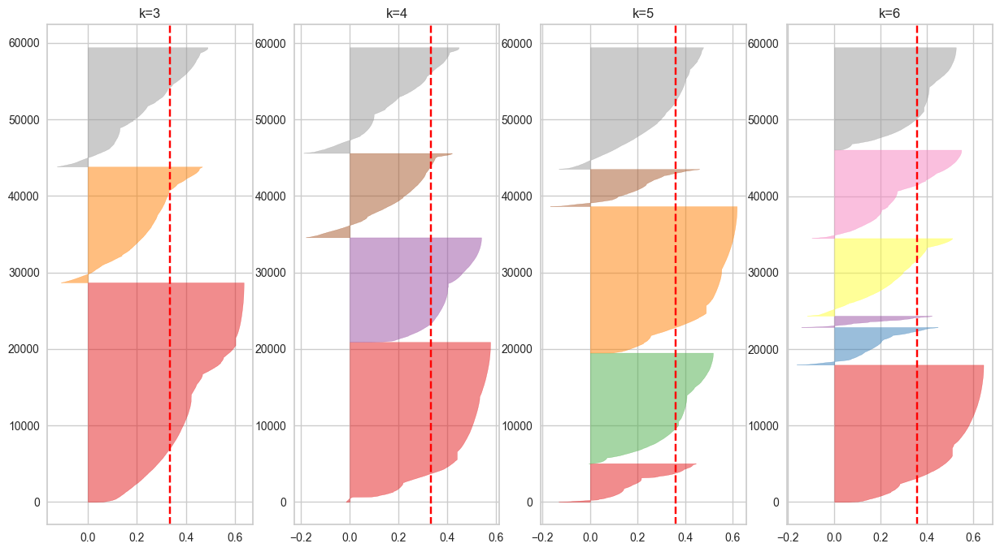

In [9]:
fig, axs = plt.subplots(1, 4, figsize=(15, 8)) 

for i,k in enumerate(range(3,7)):
    model = KMeans(random_state=17, n_init=10, n_clusters=k)
    viz = SilhouetteVisualizer(model, ax=axs[i])
    viz.fit(X)
    axs[i].set_title('k='+str(k))
plt.show()

> K = 4 provides us a good balance of interpretability, Cluster Splits, and less negative results.

In [10]:
#Based on the above plots, using n=4 (4 clusters)
kmeans = KMeans(n_clusters=4)
y = kmeans.fit_predict(X)
results = scenes[['females', 'males', 'importance']].copy()
results['cluster'] = y.astype(str)
scenes['cluster'] = y

In [11]:
results = results[results['females'] < 10]
results = results[results['males'] < 10]

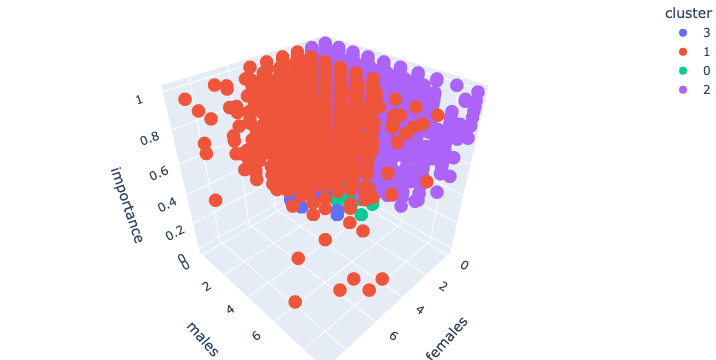

In [12]:
fig = px.scatter_3d(results, x='females', y='males', z='importance', color='cluster')
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [13]:
print('men:', scenes.males.sum())
print('women:', scenes.females.sum())
print('non-binary:', scenes.nbs.sum())

men: 76761
women: 38697
non-binary: 395


### Cluster Characteristics:

| Cluster           | Number Women | Number Men | Importance | Avg Talk Men |
| :---------------- | :------ | :---- |  :---- | :---- |
| 0 |  Very Little   | A Little | Not Very | 29.06%
| 1 |  Very Little   | A Lot | Somewhat - Very | 64.35%
| 2 |  A Little   | Very Little | Not Very | 86.1%
| 3 |  A Lot   | Very Little - Some | Somewhat - Very | 70.6%


These results show that in our dataset, the "importance" of a scene does not directly correspond to the Bechdel indicator. Because Men make up the 2/3 of the characters in the scenes we had, they were referenced to a lot. However, the more important scenes had slightly less mentions of Men.

## Question 3.2

*How can we use Latent Dirichlet Allocation to better understand the topics within our scenes/movies?*

In [14]:
nltk.download('words')
words = set(nltk.corpus.words.words())

[nltk_data] Downloading package words to /Users/rajshah/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [15]:
# Perform topic modeling using Latent Dirichlet Allocation (LDA)


tfidf = []
for f in os.listdir('Dataset/allScenes'):
    if not f.endswith('.csv'):
        continue
    filename = f.split('_scenes.csv')[0]
    scenes = pd.read_csv('Dataset/allScenes/' + f, index_col=False).total_tokens.values
    full_tokens = []
    full_scenes = []

    for scene in scenes:
        scene_x = ast.literal_eval(scene)
        full_scenes.append([token for token in scene_x if token in words])
        full_tokens += scene_x
    full_tokens = [token for token in full_tokens if token in words]
    tfidf.append({
        'movie_filename': filename,
        'tokens': full_tokens,
        'text': (' ').join(full_tokens),
        'scenes': full_scenes
    })
tfidf = pd.DataFrame(tfidf)
tfidf.head()

,movie_filename,tokens,text,scenes
0,Easy-A,"[go, two, town, neighboring, every, video, con...",go two town neighboring every video confess lo...,"[[go, two, town, neighboring, every, video, co..."
1,Killers-Of-The-Flower-Moon-Read-The-Screenplay,"[sacred, teaching, white, bury, gave, pah, gra...",sacred teaching white bury gave pah grandfathe...,"[[sacred, teaching, white, bury, gave, pah, gr..."
2,Cast-Away,"[pretty, gas, way, get, cut, mountain, filter,...",pretty gas way get cut mountain filter engine ...,"[[pretty], [gas, way, get, cut, mountain, filt..."
3,Ghost-Ship,"[work, cabin, mind, friendship, find, know, ma...",work cabin mind friendship find know main talk...,"[[work, cabin, mind, friendship, find, know, m..."
4,Downsizing,"[afraid, know, happen, make, right, born, thin...",afraid know happen make right born thing old g...,"[[afraid, know, happen, make, right, born, thi..."


In [16]:
tfidf_model = TfidfVectorizer()
tfidf_model = tfidf_model.fit(tfidf.text.values)
X_tf = tfidf_model.transform(tfidf.text.values)
tfidf = pd.concat([tfidf, pd.DataFrame(X_tf.toarray(), columns=tfidf_model.get_feature_names_out())], axis = 1)
tfidf.head()

,movie_filename,tokens,text,scenes,aa,aam,aardvark,aback,abacus,abandon,...,zoned,zoning,zoo,zoological,zoology,zoom,zoonotic,zorro,zucchini,zygomatic
0,Easy-A,"[go, two, town, neighboring, every, video, con...",go two town neighboring every video confess lo...,"[[go, two, town, neighboring, every, video, co...",0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
1,Killers-Of-The-Flower-Moon-Read-The-Screenplay,"[sacred, teaching, white, bury, gave, pah, gra...",sacred teaching white bury gave pah grandfathe...,"[[sacred, teaching, white, bury, gave, pah, gr...",0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
2,Cast-Away,"[pretty, gas, way, get, cut, mountain, filter,...",pretty gas way get cut mountain filter engine ...,"[[pretty], [gas, way, get, cut, mountain, filt...",0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
3,Ghost-Ship,"[work, cabin, mind, friendship, find, know, ma...",work cabin mind friendship find know main talk...,"[[work, cabin, mind, friendship, find, know, m...",0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
4,Downsizing,"[afraid, know, happen, make, right, born, thin...",afraid know happen make right born thing old g...,"[[afraid, know, happen, make, right, born, thi...",0.0,0.0,0.0,0.0,0.0,0.012053,...,0.0,0.0,0.0,0.0,0.0,0.013205,0.0,0.0,0.0,0.0


In [17]:
lda = LatentDirichletAllocation(
    n_components=25,
    random_state=17,
).fit(X_tf.toarray())

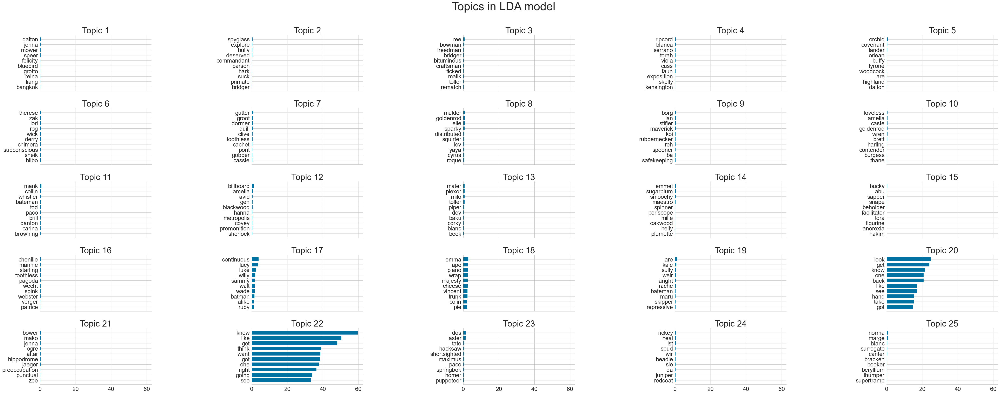

In [18]:
# Plot top words for each topic in LDA model

plot_top_words(
    lda, tfidf_model.get_feature_names_out(), 10, "Topics in LDA model", 5
)

This is no good. There's lots of names, and some topics seemt o just be collections of languages. Let's filter out extremes - words that appear in less than 15 documents (Scripts) total, and words that appear in more than half the documents. Taken from: https://towardsdatascience.com/topic-modeling-and-latent-dirichlet-allocation-in-python-9bf156893c24

In [19]:
# Filter extreme words

text_vals = tfidf.text.iloc[:,0].values
countVect = CountVectorizer()
countVect = countVect.fit(text_vals)
X_cv = countVect.transform(text_vals)
pdCV = pd.DataFrame(X_cv.toarray(), columns=countVect.get_feature_names_out())

In [20]:
pdCV[pdCV > 0] = 1
pdCV = pdCV.loc[:,(pdCV.sum(axis=0) > 15)]
pdCV = pdCV.loc[:,(pdCV.sum(axis=0) < pdCV.shape[0]/2)]
good_tokens = set(pdCV.columns.values)

In [21]:
tfidf = []
for f in os.listdir('Dataset/allScenes'):
    if not f.endswith('.csv'):
        continue
    filename = f.split('_scenes.csv')[0]
    scenes = pd.read_csv('Dataset/allScenes/' + f, index_col=False).total_tokens.values
    full_tokens = []
    full_scenes = []

    for scene in scenes:
        scene_x = ast.literal_eval(scene)
        full_scenes.append([token for token in scene_x if token in words])
        full_tokens += scene_x
    full_tokens = [token for token in full_tokens if token in good_tokens]
    tfidf.append({
        'movie_filename': filename,
        'tokens': full_tokens,
        'tokens_text': (' ').join(full_tokens),
        'scenes': full_scenes
    })
tfidf = pd.DataFrame(tfidf)

In [22]:
tfidf_model = TfidfVectorizer()
tfidf_model = tfidf_model.fit(tfidf.tokens_text.values)
X_tf = tfidf_model.transform(tfidf.tokens_text.values)
tfidf = pd.concat([tfidf, pd.DataFrame(X_tf.toarray(), columns=tfidf_model.get_feature_names_out())], axis = 1)


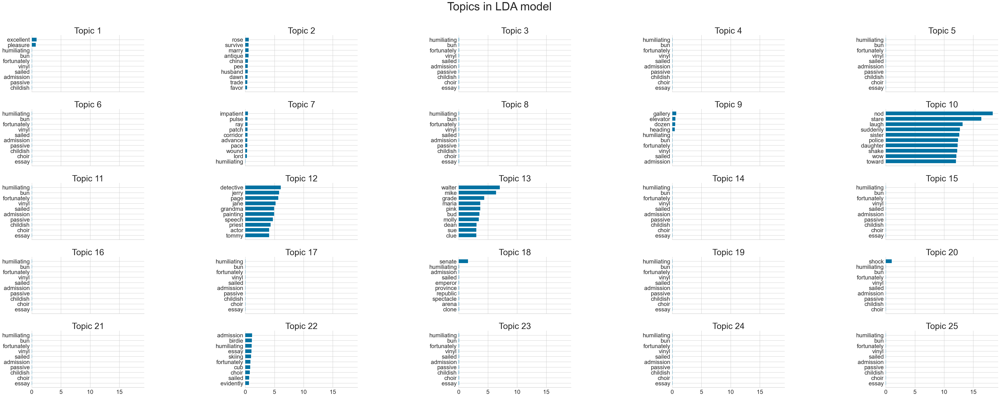

In [23]:
# Plot top words for each topic in LDA model 

lda = LatentDirichletAllocation(
    n_components=25,
    random_state=20,
).fit(X_tf.toarray())

plot_top_words(
    lda, tfidf_model.get_feature_names_out(), 10, "Topics in LDA model", 5
)

> This is much better at removing names and foreign words. I think we can see some themes, though the only one that really stands out is Topic 21, which is clearly about ships at sea.

Scikit doesn't leverage coherence scores unfortunately (the GenSim Library allows for this). So now, let me cut the topics into scenes that pass the Bechdel Test, and scenes that don't, and see if they have different types of topics.

In [36]:
tfidf_pass = []
tfidf_fail = []
for f in os.listdir('Dataset/allScenes'):
    if not f.endswith('.csv'):
        continue
    filename = f.split('_scenes.csv')[0]
    sceneDF = pd.read_csv('Dataset/allScenes/' + f, index_col=False) 
    full_tokens = []
    full_scenes = []    
    for scene in sceneDF.iterrows():
        curr_scene = scene[1]
        scene_x = ast.literal_eval(curr_scene.total_tokens)
        tokens = [token for token in scene_x if token in good_tokens]
        if ((curr_scene['chars'] >= 2) and (curr_scene['males'] < 1) and (curr_scene['talking_about_men'] == False)):
            tfidf_pass.append({
                'tokens': tokens,
                'tokens_text': (' ').join(tokens)
            })
        else:
            tfidf_fail.append({
                'tokens': tokens,
                'tokens_text': (' ').join(tokens)
            })

tfidf_pass = pd.DataFrame(tfidf_pass)
tfidf_fail = pd.DataFrame(tfidf_fail)

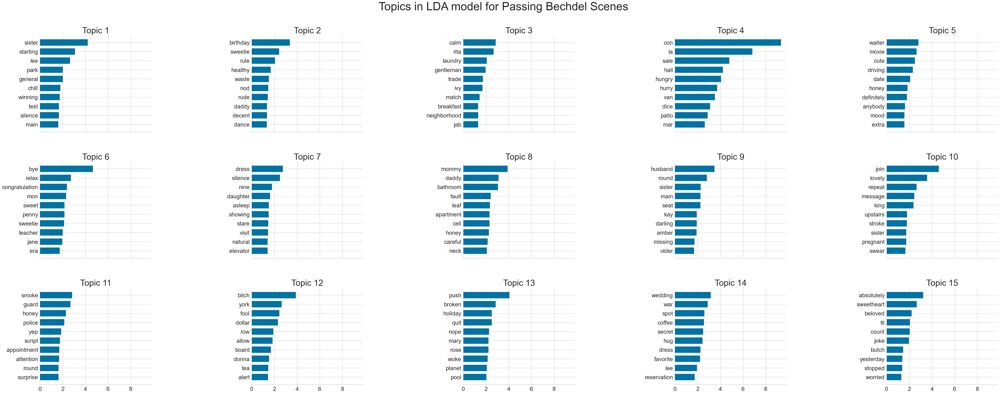

In [47]:
# Plot top words for each topic in LDA model passing the bechdel test


tfidf_model = TfidfVectorizer()
tfidf_model = tfidf_model.fit(tfidf_pass.tokens_text.values)
X_tf = tfidf_model.transform(tfidf_pass.tokens_text.values)

tfidf = pd.concat([tfidf_pass, pd.DataFrame(X_tf.toarray(), columns=tfidf_model.get_feature_names_out())], axis = 1)
lda = LatentDirichletAllocation(
    n_components=15,
    random_state=20,
).fit(X_tf.toarray())

plot_top_words(
    lda, tfidf_model.get_feature_names_out(), 10, "Topics in LDA model for Passing Bechdel Scenes", 3
)

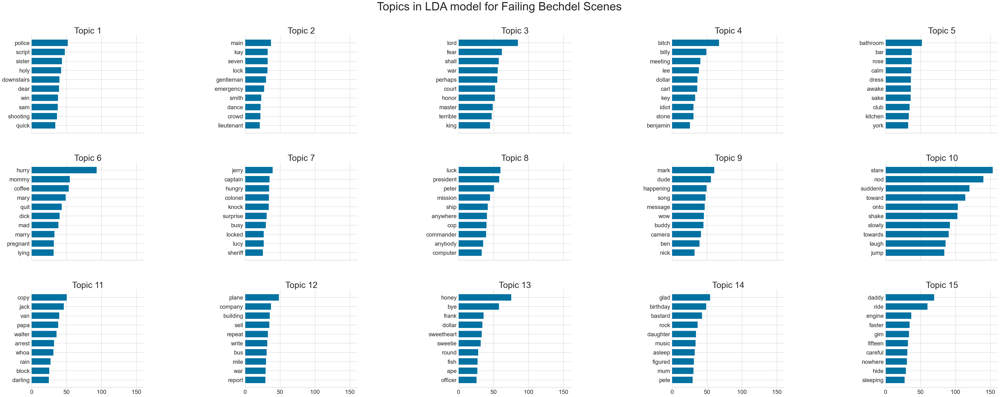

In [48]:
# Plot top words for each topic in LDA model failing the bechdel test


tfidf_model = TfidfVectorizer()
tfidf_model = tfidf_model.fit(tfidf_fail.tokens_text.values)
X_tf = tfidf_model.transform(tfidf_fail.tokens_text.values)

tfidf = pd.concat([tfidf_fail, pd.DataFrame(X_tf.toarray(), columns=tfidf_model.get_feature_names_out())], axis = 1)
lda = LatentDirichletAllocation(
    n_components=15,
    random_state=20,
).fit(X_tf.toarray())

plot_top_words(
    lda, tfidf_model.get_feature_names_out(), 10, "Topics in LDA model for Failing Bechdel Scenes", 3
)

This is great! In the Passing Bechdel scenes, we get to see unique groups of Topics, though the individual Topics aren't the most straightforward. The only clear one is the Spanish Topic. 

However, the failing Bechdel scenes directly show us more clear genres - for example presidential type movies, almost war based movies, or medieval era movies!